In [1]:
import torch
import torchvision
from torchvision import models
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import math
import os
import time
from torch.distributions import Normal

device = torch.device("cuda:1" if torch.cuda.is_available() else "cpu")

In [2]:
n_bits = 4

In [3]:
#CIFAR10
transform = transforms.Compose([
     transforms.Lambda(lambda im: np.array(im, dtype=np.float32)),
     transforms.Lambda(lambda x: np.floor(x / 2**(8 - n_bits)) / 2**n_bits), #bit reduction
     transforms.ToTensor(),
     transforms.Lambda(lambda t: t + torch.rand_like(t) / 2**n_bits) # dequantization like we did on NICE
    ])  

trainset = torchvision.datasets.CIFAR10(root='./cifar', train=True,
                                        download=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=100,
                                          shuffle=True, num_workers=32)

classes = ('airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck')

Files already downloaded and verified
Files already downloaded and verified


In [3]:
#CelebA
transform = transforms.Compose([transforms.CenterCrop(192),  #
                                       transforms.Resize(64),
     transforms.Lambda(lambda im: np.array(im, dtype=np.float32)),
     transforms.Lambda(lambda x: np.floor(x / 2**(8 - n_bits)) / 2**n_bits),
     transforms.ToTensor(),
     transforms.Lambda(lambda t: t + torch.rand_like(t) / 2**n_bits)
    ])  

trainset = torchvision.datasets.CelebA(root='./celeba', split='train', transform=transform, download=False)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=20, shuffle=True, num_workers=32)

In [4]:
# functions to show an image
def imshow(img):
    #print(img)
    img = img #/ 2 + 0.5     # unnormalize
    #print(img)
    npimg = img.numpy()
    #print(npimg.shape)
    transposed = np.transpose(npimg, (1, 2, 0))
    #print(transposed.shape)
    plt.imshow(transposed)
    plt.show()


# get some random training images
dataiter = iter(trainloader)

torch.Size([20, 3, 64, 64])
torch.Size([3, 200, 530])


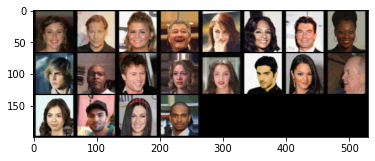

In [5]:
images, labels = dataiter.next()
print(images.shape)
print(torchvision.utils.make_grid(images).shape)
# show images
imshow(torchvision.utils.make_grid(images))

In [6]:
images.shape #B, C, H, W

torch.Size([20, 3, 64, 64])

In [7]:
len(dataiter)

8139

In [8]:
class ActNorm(nn.Module):

    def __init__(self, channels):
        super().__init__()
        self.s = nn.Parameter(torch.ones(1, channels,1,1))
        self.b = nn.Parameter(torch.zeros(1, channels, 1,1))
        #this is just a flag to know if s and b have been initialized
        self.data_init = 0

    def forward(self, x):
        # if it's the first time, initialize the b, s depending on x
        if not self.data_init:
            # here is the tricky part 
            # paper says 
            # These parameters are initialized such that the post-actnorm activations per-channel have zero mean 
            # and unit variance given an initial minibatch of data
            # I'm guessing that means substracting the mean and dividing by the standard deviation
            # so I'm setting b to -(per_channel mean) and s to (1/(per_channel std))
            
            #x is going to be in B,C,H,W format
            #getting per channel mean and standard deviation
            per_channel = x.transpose(0,1).flatten(1)
            channels = per_channel.shape[0]
            means = -per_channel.mean(1) #substracting the mean
            stds = 1/(per_channel.std(1)+1e-6) #dividing over the standard deviation, 
                                               #just making sure not to divide by zero 
            
            #means and stds have shapes [channels]
            #have to be in (1,channels, 1, 1) shape to copy to b and s
            means = means.view(1, channels, 1, 1)
            stds = stds.view(1, channels, 1, 1)
            
            #copying to b and s
            self.b.data.copy_(means)
            self.s.data.copy_(stds)
            self.data_init = 1

        y = x * self.s + self.b
        log_det = x.shape[2] * x.shape[3] * torch.log(self.s.abs()).sum() 
        return y, log_det

    def backward(self, y):
        x = (y - self.b) / self.s
        log_det = - y.shape[2] * y.shape[3] * torch.log(self.s.abs()).sum()
        return x, log_det

In [9]:
class CouplingFunction(nn.Module):
    """ The coupling functions used in GLOW
        A 3-layer CNN as mentioned in the paper
        Hidden layers have 512 filters
        Used for both s and t
        channels is iqual to the half the channels at current scale
        set scale = False for translation t
    """

    def __init__(self, channels):
        super(CouplingFunction,self).__init__()
        self.channels = channels
        self.conv_layer1 = nn.Conv2d(channels//2, 512, kernel_size=3, padding=1)
        self.conv_layer2 = nn.Conv2d(512, 512, kernel_size=1, padding=1)
        self.conv_layer3 = nn.Conv2d(512, channels, kernel_size=3)
        
        self.scale_factor = nn.Parameter(torch.zeros(channels,1,1))
        
        #Use of actnorm taken directly from openAI tf implementation
        self.actn1 = ActNorm(512)
        self.actn2 = ActNorm(512)
        
        #last convolution is initialized to zeros
        self.conv_layer3.weight.data.zero_()
        self.conv_layer3.bias.data.zero_()
        
    def forward(self, x):
        z = self.conv_layer3(torch.relu(self.actn2(self.conv_layer2(torch.relu(self.actn1(self.conv_layer1(x))[0])))[0]))
        z = z * torch.exp(self.scale_factor)
        
        #use half the channels for s and half for t
        s = z[:,:self.channels//2,:,:]
        t = z[:,self.channels//2:,:,:]
        
        #Use of sigmoid taken from openAI tf implementation, RealNVP mentions using tanh
        return torch.sigmoid(s + 2.), t #adding 2 to get identity on first time

In [10]:
class AffineCouplingLayer(nn.Module):
    """
    Affine coupling layer from GLOW paper
    y1 = s * x1 + t
    y2 = x2
    Coupling functions are 3-layer CNN networks
    """
    
    def __init__(self, channels):
        super(AffineCouplingLayer, self).__init__()
        self.coupling = CouplingFunction(channels)
        
    def forward(self, x):
        #get 2 chunks over dimension 1, data is in B, C, H, W dimensions
        x1, x2 = x.chunk(2,1)
        s, t = self.coupling(x2)
        
        y1 = s * x1 + t
        y2 = x2
        log_det = torch.log(s).sum([1,2,3])
        return torch.cat((y1, y2), dim=1), log_det
    
    def backward(self, y):
        y1, y2 = y.chunk(2,1)
        s, t = self.coupling(y2)
        x1 = (y1 - t) / s
        x2 = y2
        log_det = - torch.log(s).sum([1,2,3])
        return torch.cat((x1, x2), dim=1), log_det

In [11]:
torch.zeros(2).shape

torch.Size([2])

In [12]:
class AdditiveCouplingLayer(nn.Module):
    """
    Affine coupling layer from NICE paper
    y1 = x1 + t
    y2 = x2
    Coupling functions are 3-layer CNN networks
    """
    
    def __init__(self, channels):
        super(AffineCouplingLayer, self).__init__()
        self.coupling = CouplingFunction(channels)
        
    def forward(self, x):
        #get 2 chunks over dimension 1, data is in B, C, H, W dimensions
        x1, x2 = x.chunk(2,1)
        s, t = self.coupling(x2)
        
        y1 = x1 + t
        y2 = x2
        log_det = torch.zeros(x.shape[0])
        return torch.cat((y1, y2), dim=1), log_det
    
    def backward(self, y):
        y1, y2 = y.chunk(2,1)
        s, t = self.coupling(y2)
        x1 = y1 - t
        x2 = y2
        log_det = torch.zeros(y.shape[0])
        return torch.cat((x1, x2), dim=1), log_det

In [13]:
class InvertibleConvolution(nn.Module):
    #TODO LU decomposition version
    
    def __init__(self, channels):
        super(InvertibleConvolution, self).__init__()
        #The paper says that W is initialized to a random rotation matrix with logdet = 0
        #From Wikipedia:
        #   Rotation matrices are square matrices, with real entries.
        #   More specifically, they can be characterized as orthogonal matrices with determinant 1
        #   w = torch.qr(torch.randn(channels, channels))[0]
        w = torch.nn.init.orthogonal_(torch.randn(channels, channels))
        self.w = nn.Parameter(w)
        
    def forward(self, x):
        #y = x @ self.w
        y = F.conv2d(x, self.w.unsqueeze(-1).unsqueeze(-1))
        log_det = x.shape[2] * x.shape[3] * torch.slogdet(self.w)[1]
        return y, log_det
    
    def backward(self, y):
        #x = y @ self.w.inverse()
        w_inv = self.w.inverse()
        x = F.conv2d(y, w_inv.unsqueeze(-1).unsqueeze(-1))
        log_det = - y.shape[2] * y.shape[3] * torch.slogdet(self.w)[1]
        return x, log_det

In [14]:
class Squeeze(nn.Module):
    #Ok, had to go the openAI tf implementation for this
    #The squeezing operation transforms an s × s × c tensor into an 2/s × 2/s × 4c tensor
    def __init__(self):
        super().__init__()

    def forward(self, x):
        _,C,H,W = x.shape
        x = x.reshape(-1, C, H//2, 2, W//2, 2)   
        x = x.permute(0, 1, 3, 5, 2, 4)         
        x = x.reshape(-1, 4*C, H//2, W//2)       
        return x

    def backward(self, x):
        _,C,H,W = x.shape
        x = x.reshape(-1, C//4, 2, 2, H, W)      
        x = x.permute(0, 1, 4, 2, 5, 3)         
        x = x.reshape(-1, C//4, 2*H, 2*W)       
        return x

In [15]:
class Split(nn.Module):
    #RealNVP again
    #paper says
    #Propagating a D dimensional vector through all the coupling layers would be cumbersome, in terms
    #of computational and memory cost, and in terms of the number of parameters that would need to be
    #trained. For this reason we follow the design choice of [57] and factor out half of the dimensions at
    #regular intervals (see Equation 14). We can define this operation recursively (see Figure 4(b)),
    #At each layer, as the spatial resolution is reduced, the number of hidden layer features in s and t is doubled.
    #All variables which have been factored out at different scales are concatenated to obtain the final
    #transformed output (Equation 16).

    #Factoring out variables. At each step, half the variables are directly modeled as
    #Gaussians, while the otherhalf undergo further transformation.
    def __init__(self, n_channels):
        super().__init__()
        
        #Layers to learn the parameters through convolutions
        self.mean = nn.Conv2d(n_channels//2, n_channels//2, kernel_size=3, padding=1)
        self.log_std = nn.Conv2d(n_channels//2, n_channels//2, kernel_size=3, padding=1)
        
        #initializing to zero
        self.mean.weight.data.zero_()
        self.mean.bias.data.zero_()
        
        self.log_std.weight.data.zero_()
        self.log_std.bias.data.zero_()

    def forward(self, x):
        #samplig from a gaussian with known standard deviation and mean
        # If x is a sample from a mean 0 and variance 1 distribution then
        # std * x + mean
        x1, x2 = x.chunk(2, dim=1)  # split along channel dimensions
        mu = self.mean(x1)  # learn mu and log_std from x1
        l_std = self.log_std(x1)          
        z2 = (x2 - mu) * torch.exp(-l_std)  #modeling as gaussians
        logdet = -l_std.sum([1,2,3])
        return x1, z2, logdet

    
    def backward(self, x1, z2):
        mu = self.mean(x1)  
        l_std = self.log_std(x1)
        x2 = z2 * torch.exp(l_std) - mu
        logdet = - l_std.sum([1,2,3])  
        return torch.cat([x1, x2], dim=1), logdet

In [16]:
class GLOWStep(nn.Module):
    """ ActNorm -> Invertible 1x1 conv -> Coupling """
    def __init__(self, channels, additive = False):
        super().__init__()
        self.actnorm = ActNorm(channels)
        self.invertible_conv = InvertibleConvolution(channels)
        self.affine = AffineCouplingLayer(channels)
        if additive:
            self.affine = AdditiveCouplingLayer(channels)

    def forward(self, x):
        total_logdet = 0.
        #Actnorm
        y, logdet = self.actnorm(x)
        total_logdet = total_logdet + logdet
        
        #Invertible convolution
        y, logdet = self.invertible_conv(y)
        #print(logdet.shape)
        total_logdet = total_logdet + logdet
        
        #Affine coupling
        y, logdet = self.affine(y)
        #print(logdet.shape)
        total_logdet = logdet + total_logdet
        
        return y, total_logdet

    def backward(self, y):
        total_logdet = 0.
        #affine backward
        x, logdet = self.affine.backward(y)
        total_logdet = total_logdet + logdet
        
        #Invertible conv backward
        x, logdet = self.invertible_conv.backward(x)
        total_logdet = total_logdet + logdet
        
        #Actnorm backward
        x, logdet = self.actnorm.backward(x)
        total_logdet = total_logdet + logdet
        
        return x, total_logdet

In [17]:
class GLOWLevel(nn.Module):
    """ Squeeze -> GLOWStep x K -> Split """
    def __init__(self, n_channels, depth=32, additive = False):
        super().__init__()
        
        # Squeeze will create 4c channels
        lst = [GLOWStep(4*n_channels, additive) for _ in range(depth)]
        self.squeeze = Squeeze()
        self.steps = nn.ModuleList(lst)
        self.split = Split(4*n_channels)

    def forward(self, x):
        #Squeezing, no log det
        x = self.squeeze(x)
        total_logdet = 0.
        
        #Going through the steps 
        for step in self.steps:
            x, logdet = step(x)
            total_logdet = total_logdet + logdet
            
        #Split    
        x1, z2, logdet_split = self.split(x)
        
        total_logdet = total_logdet + logdet_split
        return x1, z2, total_logdet

    def backward(self, x1, z2):
        x, total_logdet = self.split.backward(x1, z2)
        for step in reversed(self.steps):
            x, logdet = step.backward(x)
            total_logdet = total_logdet + logdet
        x = self.squeeze.backward(x)
        return x, total_logdet

In [18]:
class GLOW(nn.Module):
    def __init__(self, channels, depth, n_levels, additive = False):
        super().__init__()
        lst_lvl = [GLOWLevel(channels * 2**i, depth, additive) for i in range(n_levels-1)]
        self.levels = nn.ModuleList(lst_lvl)
        self.squeeze = Squeeze()
        last_n_channels = channels * 2**(n_levels-1)
        
        #after the last squeeze
        last_n_channels *= 4
        
        #The last steps without a split
        lst_step = [GLOWStep(last_n_channels, additive) for _ in range(depth)]
        self.steps = nn.ModuleList(lst_step)
        
        
        #to model as a gaussian the last z
        self.mean = nn.Conv2d(last_n_channels, last_n_channels, kernel_size=3, padding=1)
        self.log_std = nn.Conv2d(last_n_channels, last_n_channels, kernel_size=3, padding=1)
        
        #initializing to zero
        self.mean.weight.data.zero_()
        self.mean.bias.data.zero_()     
        self.log_std.weight.data.zero_()
        self.log_std.bias.data.zero_()
        
    def forward(self, x):
        # list to store the different z's
        z_list = []
        total_logdet = 0.
        
        #Go throught the levels
        for level in self.levels:
            x, z, logdet = level(x)
            total_logdet += logdet
            z_list.append(z)
            
        #Last squeeze
        x = self.squeeze(x)
        
        #Last GLOWSteps without a split
        for step in self.steps:
            x, logdet = step(x)
            total_logdet += logdet      
        
        #modeling as gaussians the last z variables
        mock_values = torch.zeros_like(x)
        mu = self.mean(mock_values)  # there's no x1 so use zeros, or ones?
        l_std = self.log_std(mock_values)     
        
        z = (x - mu) * torch.exp(-l_std)
        logdet = - l_std.sum()
        
        z_list.append(z)
        
        total_logdet = total_logdet + logdet
        
        return z_list, total_logdet
    
    def backward(self, z_list):
        # everything but in reverse order
        #sampling z from prior
        #z = temp * prior.sample((n, channels, hw, hw)).squeeze() #when sampling a 1-dim is always created at the end
        
        z = z_list[-1]
        
        #gaussian stuff
        mock_values = torch.zeros_like(z)
        mu = self.mean(mock_values)  
        l_std = self.log_std(mock_values)
        
        total_logdet = 0.
        
        x = z * torch.exp(l_std) + mu #modeling as gaussians
        logdet = l_std.sum()
        
        total_logdet = total_logdet + logdet
        
        #last steps
        for step in reversed(self.steps):
            x, logdet = step.backward(x)
            total_logdet = logdet + total_logdet
            
        #last squeeze
        x = self.squeeze.backward(x)
        
        #going through levels in revers
        for i, level in enumerate(reversed(self.levels)):
            #sampling new z's from prior
            #z = temp * prior.sample(x.shape).squeeze()
            z = z_list[-(2+i)]
            x, logdet = level.backward(x, z)
            total_logdet = total_logdet + logdet
            
        return x, total_logdet

In [19]:
def sample(prior, n_samples, n_levels, initial_channels, initial_hw, std = 1.0):
    samples = []
    n_levels -= 1 #using the highest index value
    initial_channels *= 2
    initial_hw = initial_hw // 2
    for i in range(n_levels):
        z = std * prior.sample((n_samples, initial_channels * 2**i, initial_hw // 2**i, initial_hw // 2**i)).squeeze()
        samples.append(z)
    #last z
    z = std * prior.sample((n_samples, (initial_channels * 2**n_levels)*2, initial_hw // 2**n_levels, initial_hw // 2**n_levels)).squeeze()
    samples.append(z)
    return samples

In [20]:
glow_model = GLOW(channels = 3, depth=24, n_levels=4).to(device)

In [21]:
optimizer = optim.Adam(glow_model.parameters(), lr=1e-4)

In [22]:
gaussian = Normal(torch.zeros(1).to(device), torch.ones(1).to(device))

In [22]:
#optimizer.load_state_dict(torch.load("optimizer_glow.pt"))

In [23]:
with torch.no_grad():
    zs, logdet = glow_model(images.to(device))
    x, _ = glow_model.backward(zs)
len(zs)

4

In [23]:
#glow_model.load_state_dict(torch.load("glow_cifar_3l_32d.pt"), strict=True)

In [24]:
(sum([gaussian.log_prob(z).sum([1,2,3]) for z in zs]))

tensor([-15208.6465, -16509.1758, -17291.4746, -17896.5098, -17918.9219,
        -17626.4863, -19032.6719, -15812.2744, -17404.6777, -15840.0664,
        -16572.9785, -16220.5107, -16490.0996, -19517.8027, -17142.3262,
        -15315.2920, -18063.6562, -18413.8574, -16753.0156, -18322.7188],
       device='cuda:1')

In [25]:
logdet

tensor([33308.7734, 33308.7734, 33308.7734, 33308.7734, 33308.7734, 33308.7734,
        33308.7734, 33308.7734, 33308.7734, 33308.7734, 33308.7734, 33308.7734,
        33308.7734, 33308.7734, 33308.7734, 33308.7734, 33308.7734, 33308.7734,
        33308.7734, 33308.7734], device='cuda:1')

In [26]:
#del glow_model

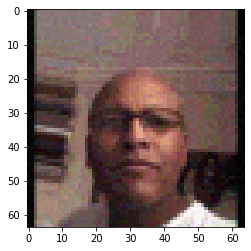

In [27]:
plt.imshow(images[9].permute(1,2,0).detach())

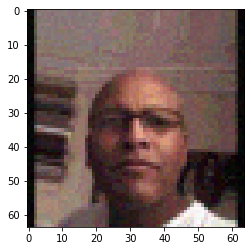

In [28]:
plt.imshow(x[9].permute(1,2,0).detach().cpu())

Epoch: 0
batch: 99 loss: -34.467899322509766
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


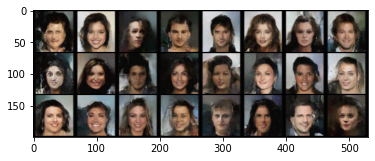

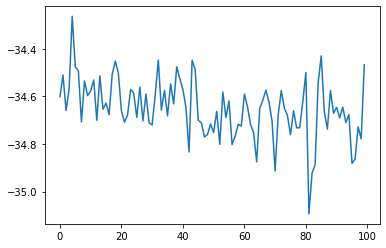

batch: 199 loss: -34.96800994873047
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


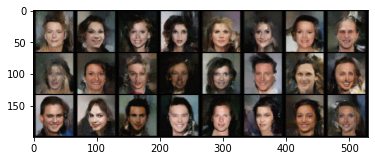

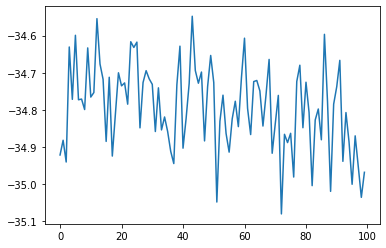

batch: 299 loss: -35.0478630065918
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


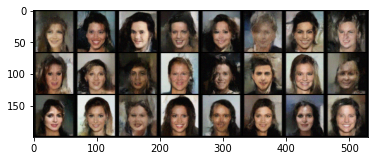

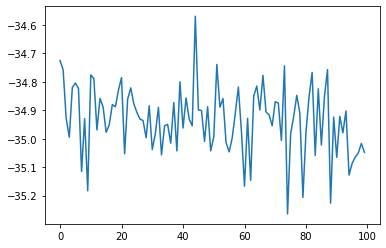

batch: 399 loss: -35.0695915222168
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


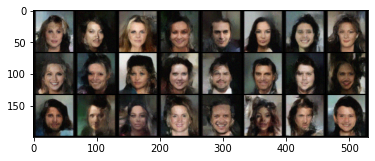

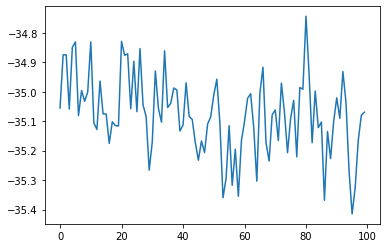

batch: 499 loss: -35.29348373413086
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


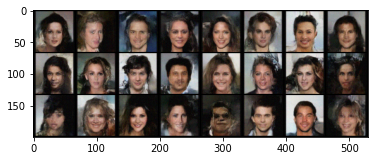

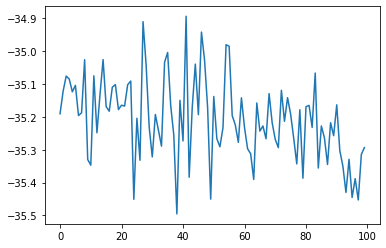

batch: 599 loss: -35.54573440551758
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


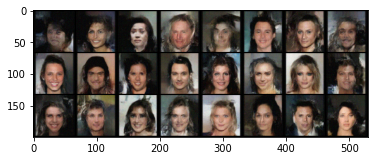

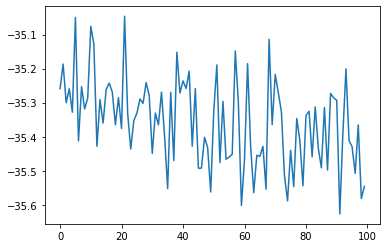

batch: 699 loss: -35.674800872802734
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


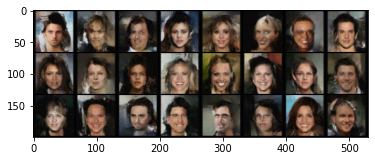

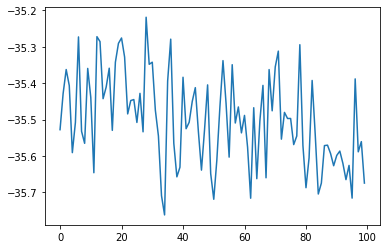

batch: 799 loss: -35.69160842895508
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


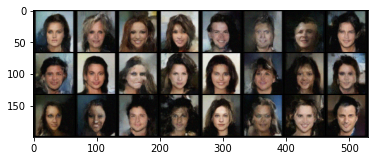

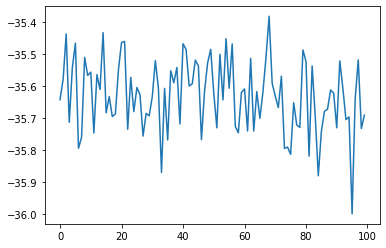

batch: 899 loss: -35.7452392578125
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


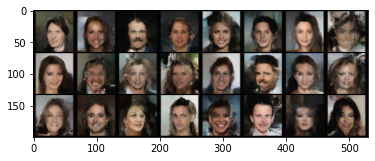

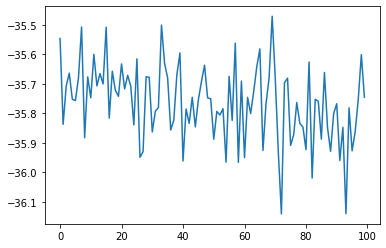

batch: 999 loss: -35.836952209472656
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


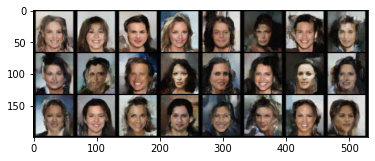

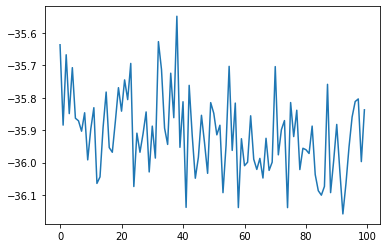

batch: 1099 loss: -36.2960205078125
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


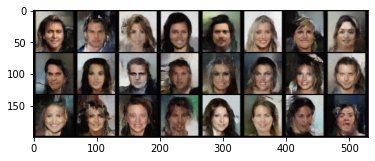

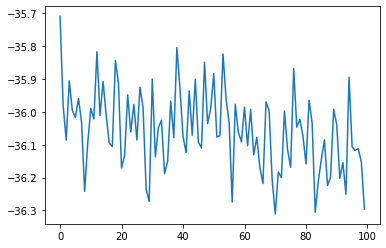

batch: 1199 loss: -36.35932159423828
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


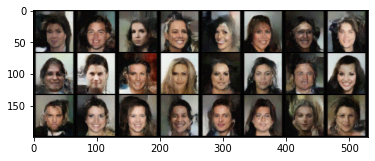

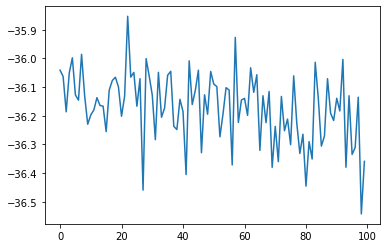

batch: 1299 loss: -36.28852462768555
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


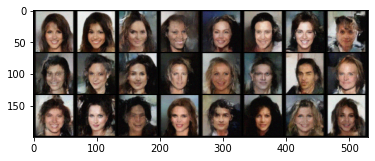

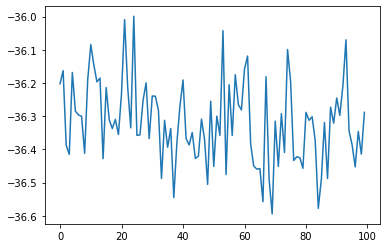

batch: 1399 loss: -36.55378341674805
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


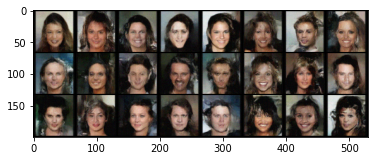

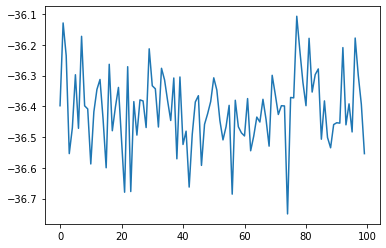

batch: 1499 loss: -36.52010726928711
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


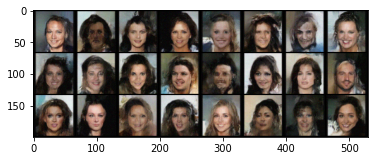

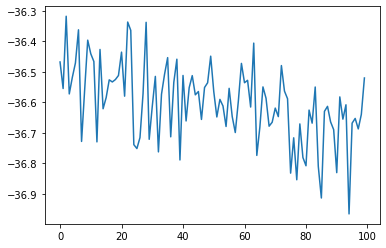

batch: 1599 loss: -36.888038635253906
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


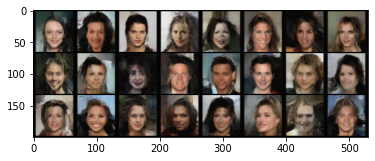

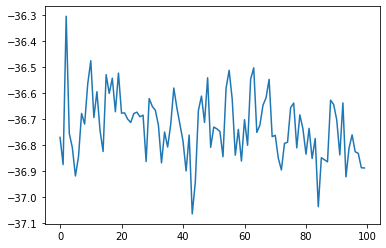

batch: 1699 loss: -36.8089599609375
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


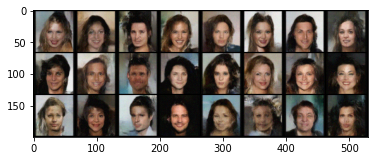

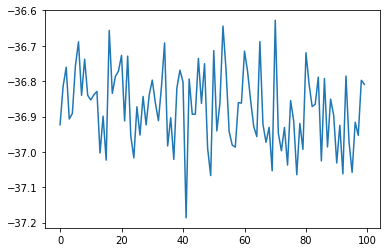

batch: 1799 loss: -36.8464241027832
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


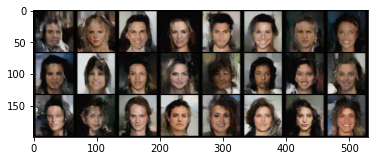

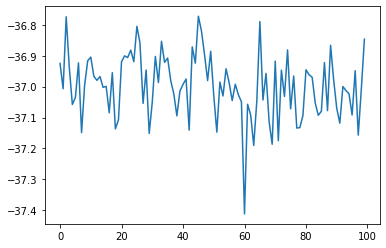

batch: 1899 loss: -37.27134323120117
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


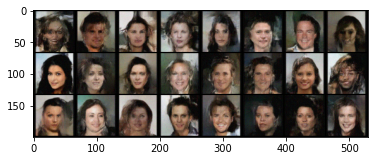

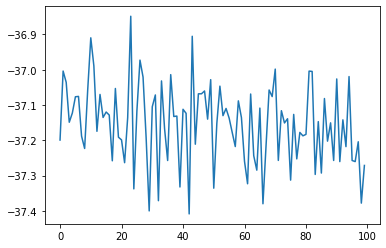

batch: 1999 loss: -37.30335998535156
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


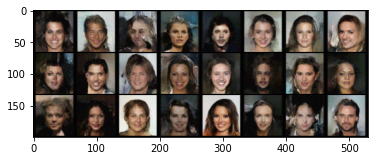

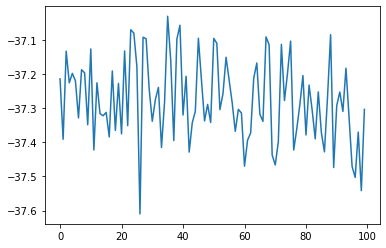

batch: 2099 loss: -37.37141799926758
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


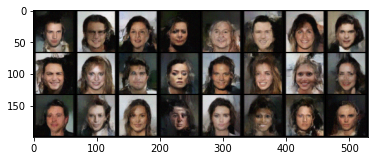

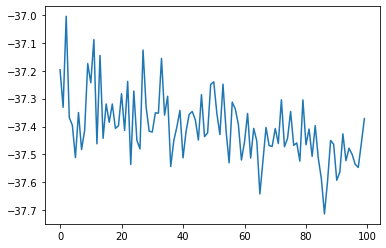

batch: 2199 loss: -37.48336410522461
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


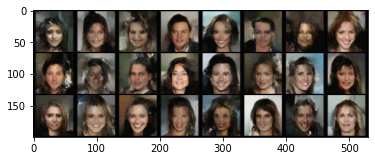

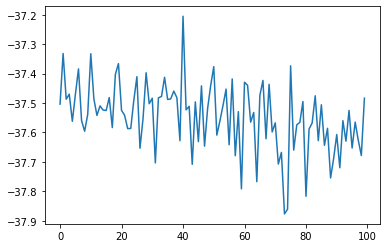

batch: 2299 loss: -37.75310134887695
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


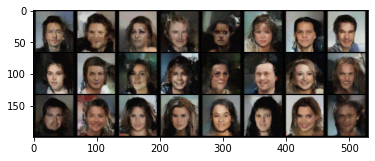

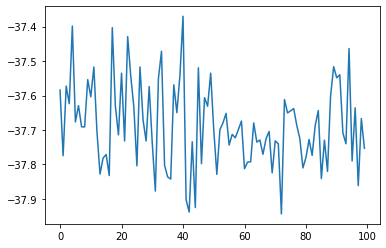

batch: 2399 loss: -38.04987335205078
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


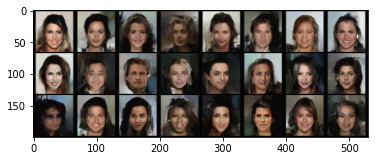

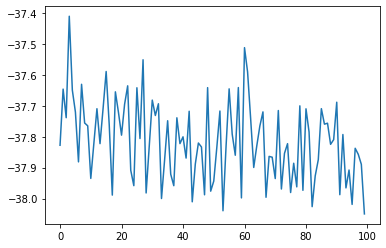

batch: 2499 loss: -37.93756866455078
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


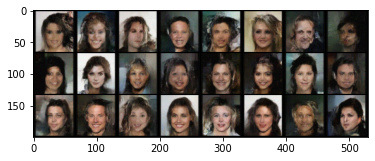

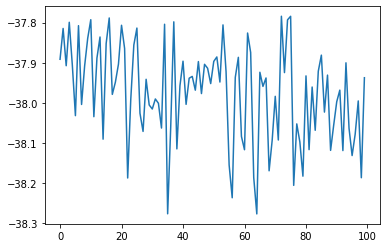

batch: 2599 loss: -38.23005294799805
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


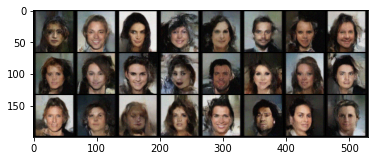

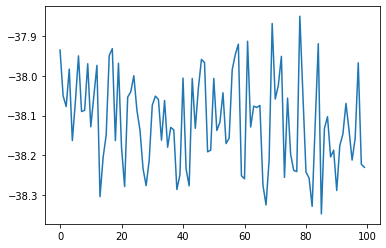

batch: 2699 loss: -38.22233963012695
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


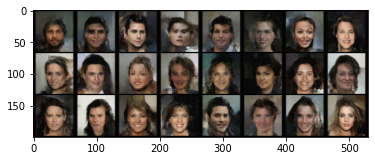

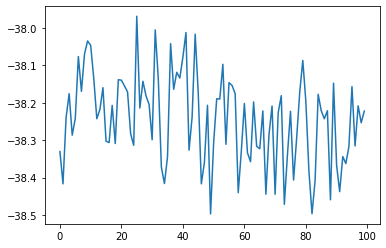

batch: 2799 loss: -38.288734436035156
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


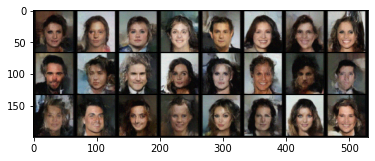

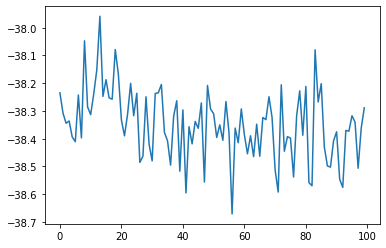

batch: 2899 loss: -38.36968231201172
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


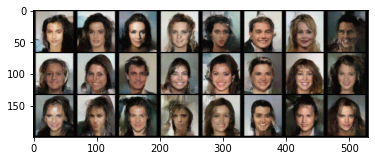

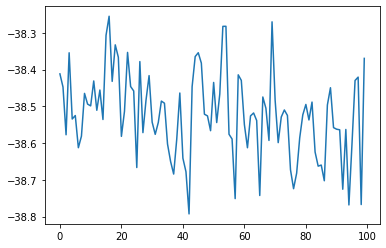

batch: 2999 loss: -38.796722412109375
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


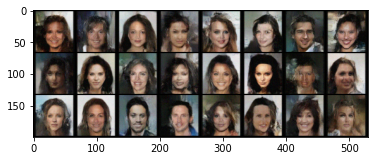

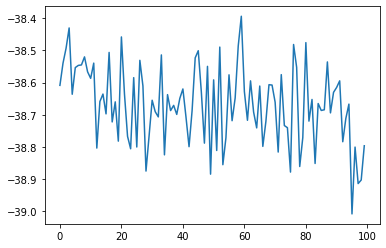

batch: 3099 loss: -38.78351593017578
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


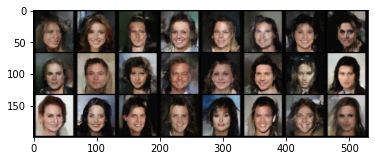

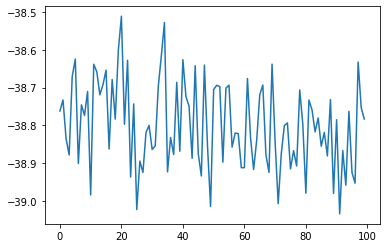

batch: 3199 loss: -39.03390121459961
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


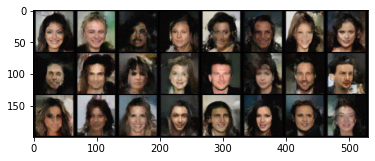

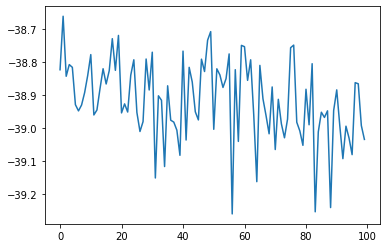

batch: 3299 loss: -39.364925384521484
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


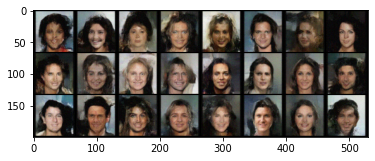

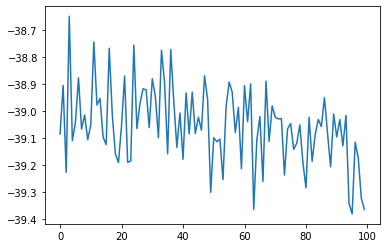

batch: 3399 loss: -39.18612289428711
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


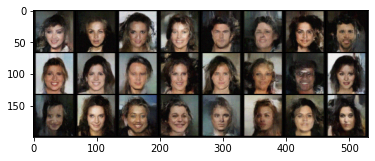

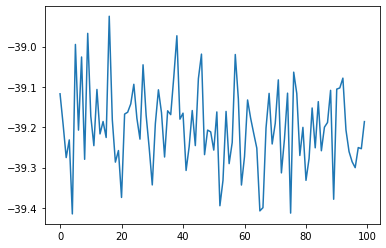

batch: 3499 loss: -39.5777473449707
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


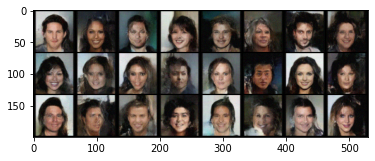

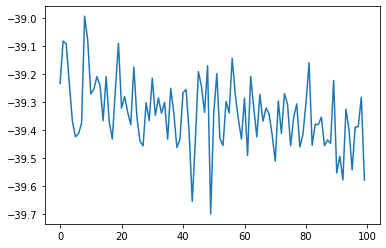

batch: 3599 loss: -39.49869918823242
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


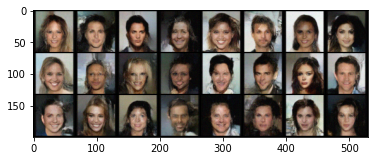

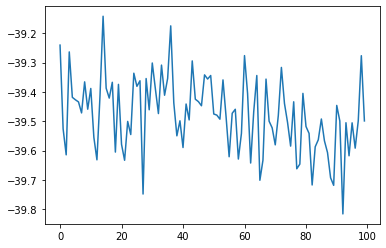

batch: 3699 loss: -39.9066276550293
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


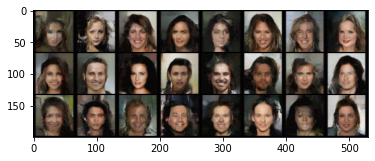

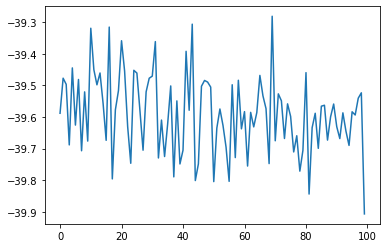

batch: 3799 loss: -39.898006439208984
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


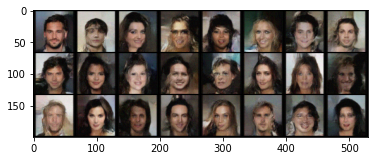

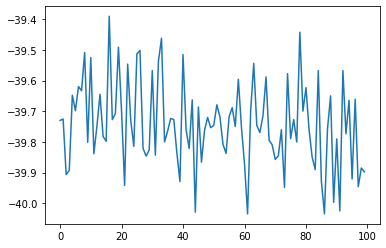

batch: 3899 loss: -40.043453216552734
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


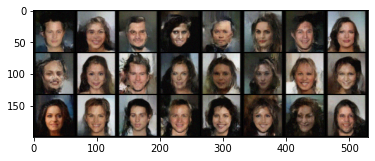

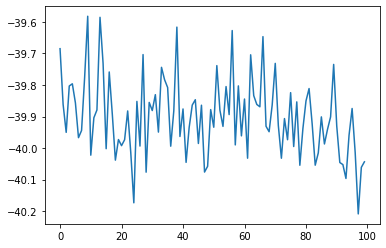

batch: 3999 loss: -40.20392990112305
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


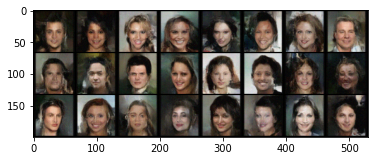

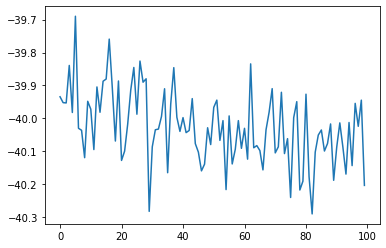

batch: 4099 loss: -40.26206588745117
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


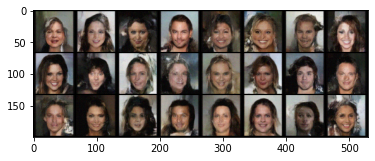

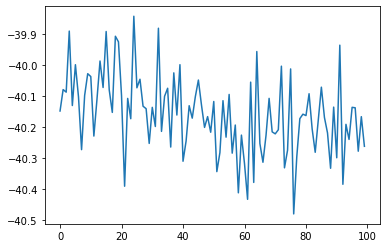

batch: 4199 loss: -40.579776763916016
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


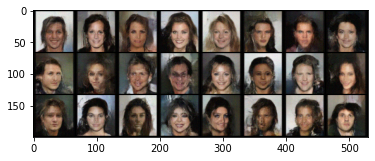

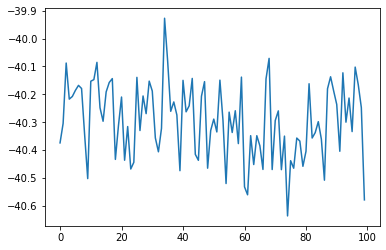

batch: 4299 loss: -40.558509826660156
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


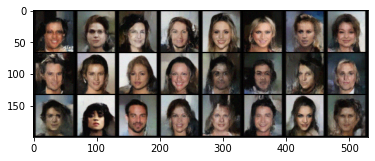

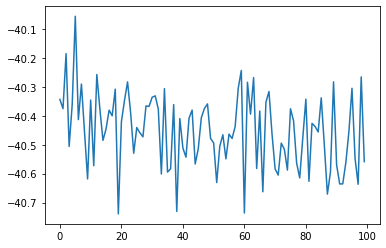

batch: 4399 loss: -40.63446044921875
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


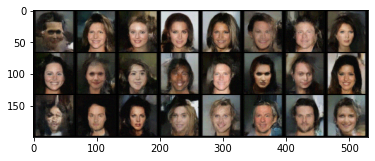

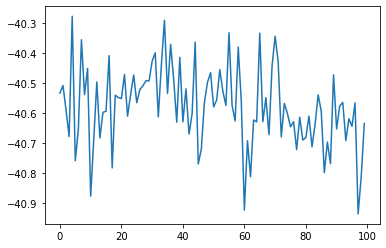

batch: 4499 loss: -40.747711181640625
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


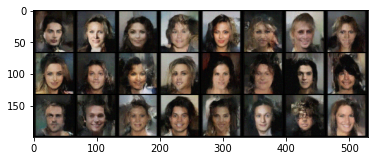

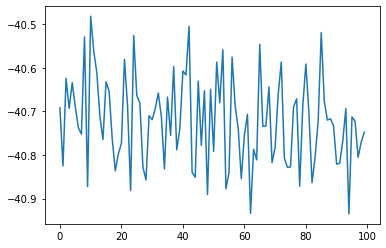

batch: 4599 loss: -40.80733108520508
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


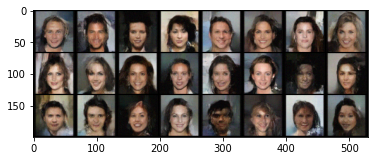

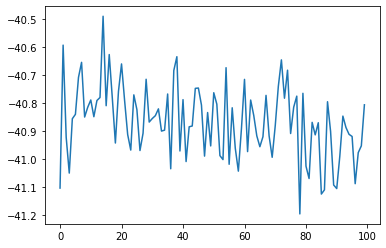

batch: 4699 loss: -40.88258743286133
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


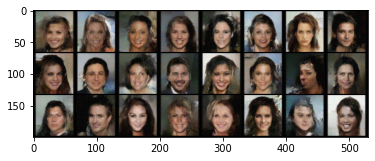

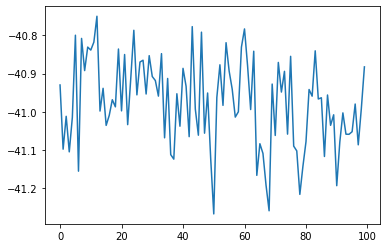

batch: 4799 loss: -41.25750732421875
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


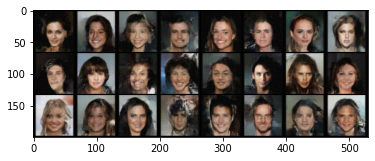

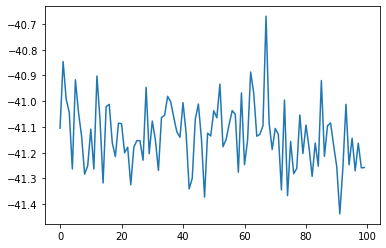

batch: 4899 loss: -41.371368408203125
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


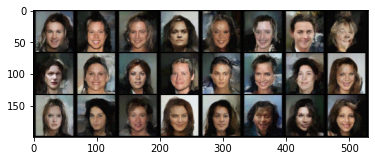

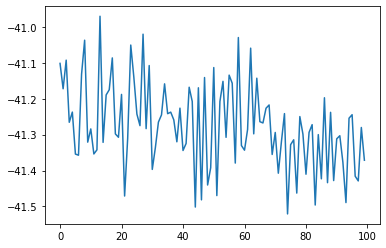

batch: 4999 loss: -41.34938430786133
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


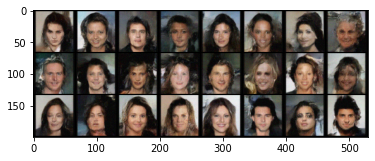

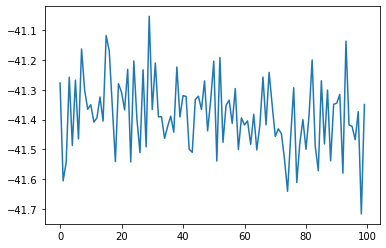

batch: 5099 loss: -41.68207931518555
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


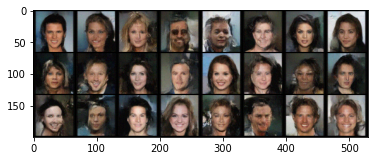

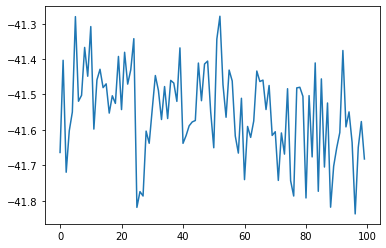

batch: 5199 loss: -41.75394821166992
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


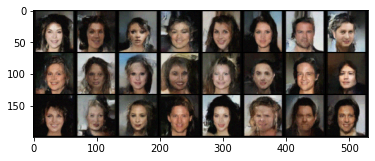

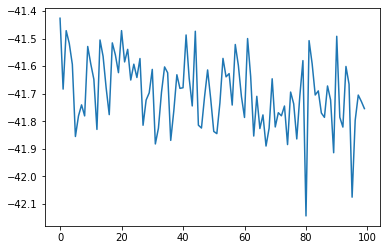

batch: 5299 loss: -41.995479583740234
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


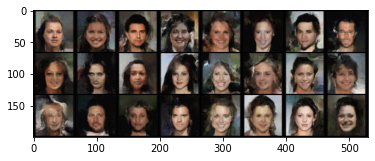

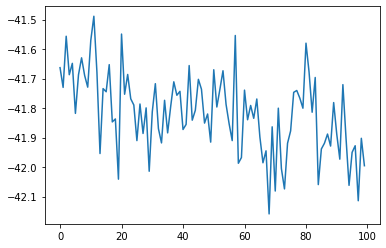

batch: 5399 loss: -41.992488861083984
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


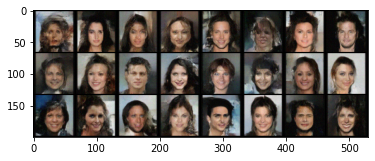

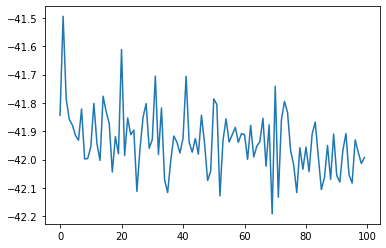

batch: 5499 loss: -42.16523361206055
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


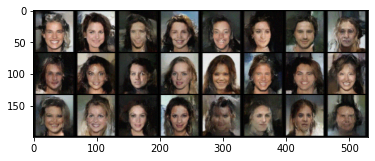

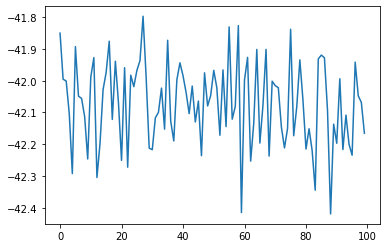

batch: 5599 loss: -42.08079147338867
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


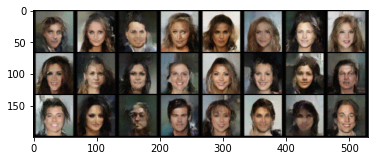

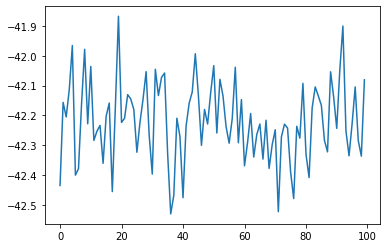

batch: 5699 loss: -42.50641632080078
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


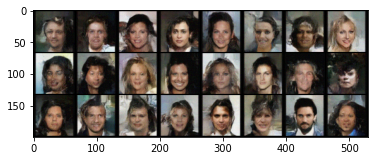

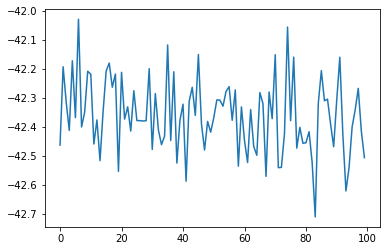

batch: 5799 loss: -42.56174850463867
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


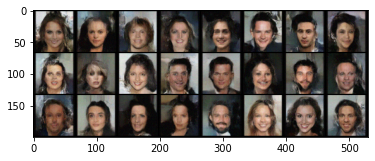

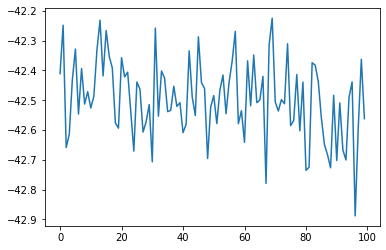

batch: 5899 loss: -42.890682220458984
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


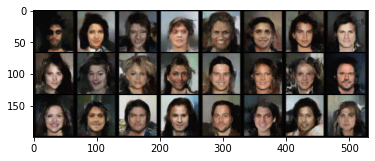

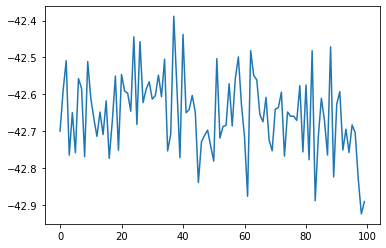

batch: 5999 loss: -42.76994705200195
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


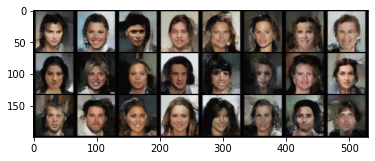

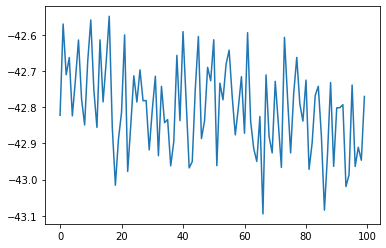

batch: 6099 loss: -42.97151565551758
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


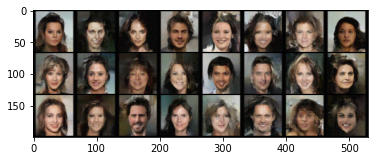

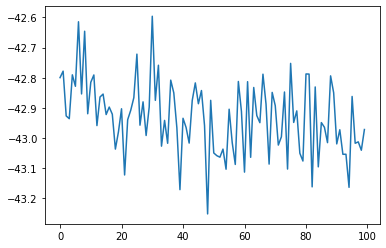

batch: 6199 loss: -43.157012939453125
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


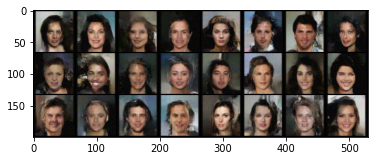

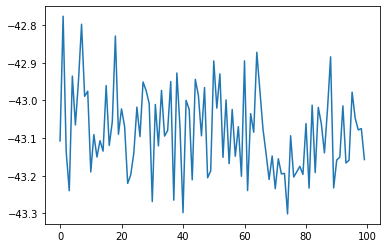

batch: 6299 loss: -43.203651428222656
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


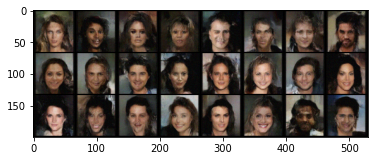

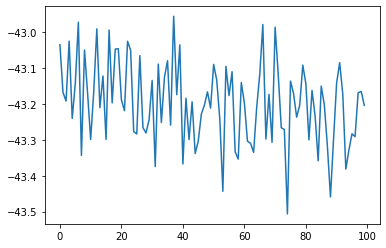

batch: 6399 loss: -43.36386489868164
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


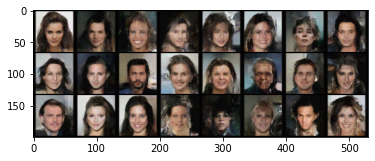

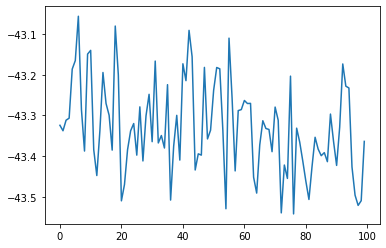

batch: 6499 loss: -43.46990966796875
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


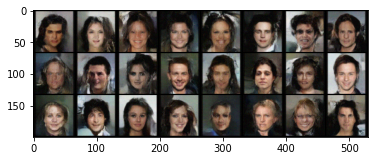

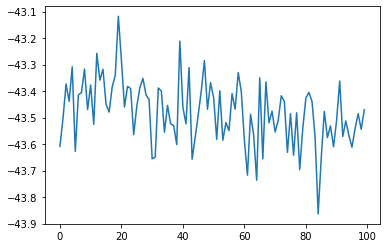

batch: 6599 loss: -43.72088623046875
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


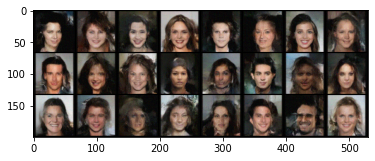

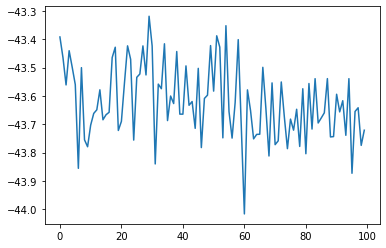

batch: 6699 loss: -43.80742263793945
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


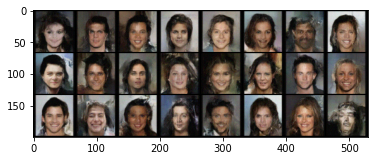

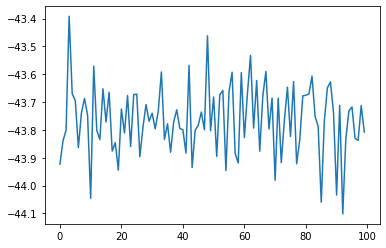

batch: 6799 loss: -44.1458625793457
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


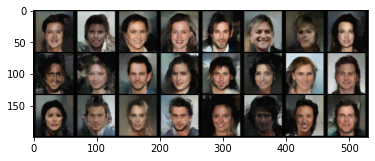

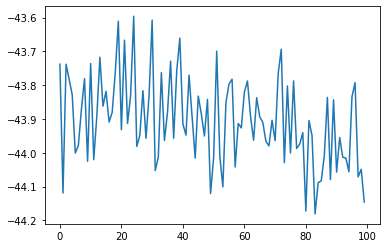

batch: 6899 loss: -44.15568161010742
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


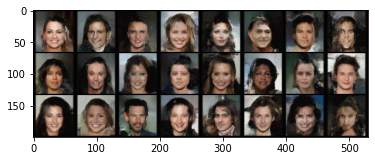

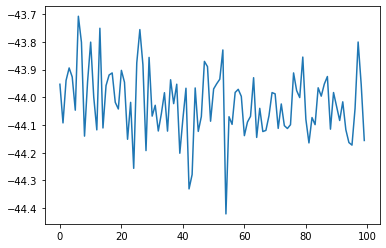

batch: 6999 loss: -44.15178298950195
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


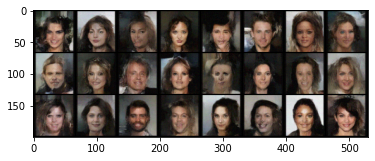

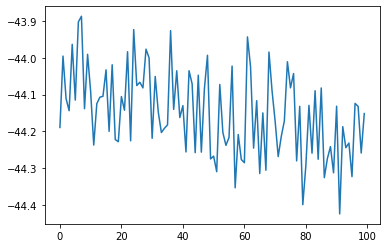

batch: 7099 loss: -44.45200729370117
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


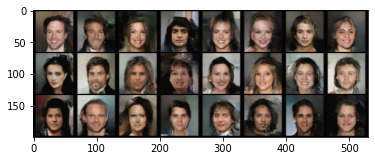

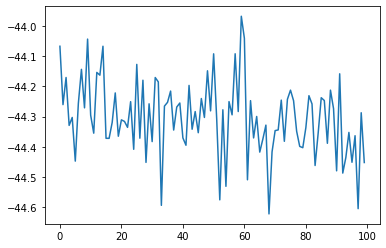

batch: 7199 loss: -44.562164306640625
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


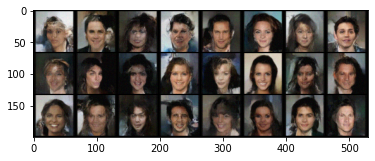

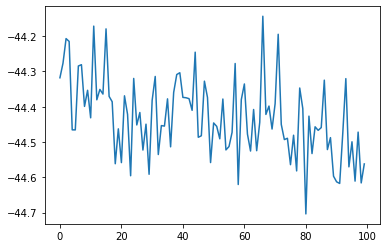

batch: 7299 loss: -44.5103874206543
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


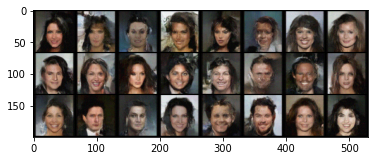

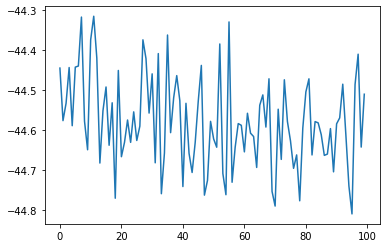

batch: 7399 loss: -44.75754928588867
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


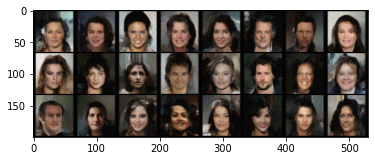

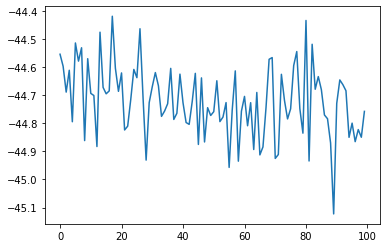

batch: 7499 loss: -45.20095443725586
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


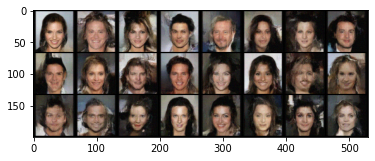

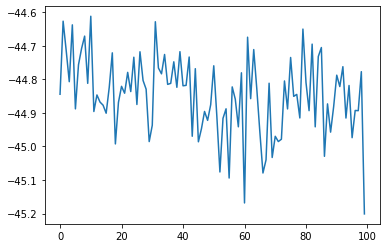

batch: 7599 loss: -45.02644729614258
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


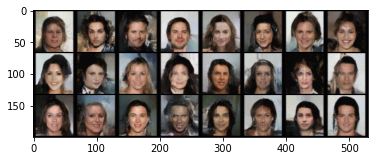

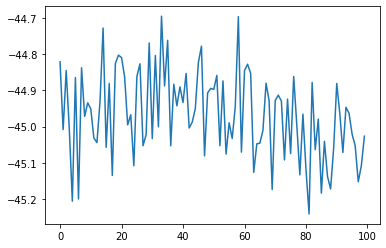

batch: 7699 loss: -45.055782318115234
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


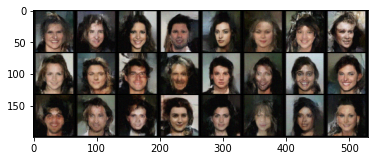

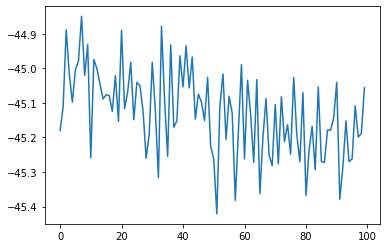

batch: 7799 loss: -45.3202018737793
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


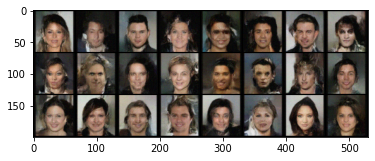

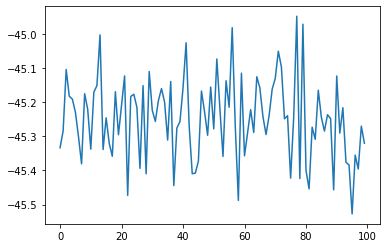

batch: 7899 loss: -45.48017501831055
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


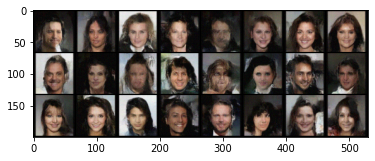

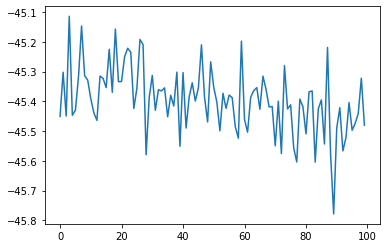

batch: 7999 loss: -45.72876739501953
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


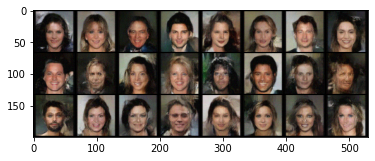

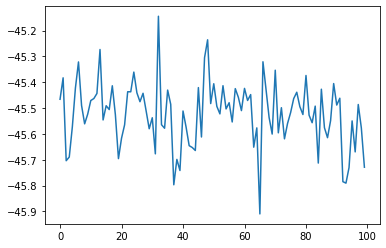

batch: 8099 loss: -45.73444747924805
Sampling


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


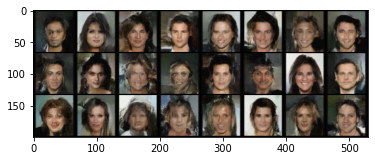

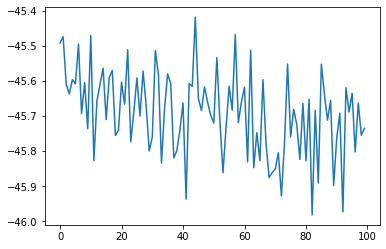

In [64]:
prior = gaussian
glow_model.train()
losses = []
eval_every = 100
for epoch in range(1):
    print("Epoch:",epoch)
    dataiter = iter(trainloader)
    for batch in range(len(dataiter)):
    #for batch in range(10):
        #print("batch:",batch)
        images, _ = dataiter.next()
        #images = images / torch.tensor(2.) + torch.tensor(0.5)
        
        zs, log_det = glow_model(images.to(device))
        
        prior_logprob = sum(prior.log_prob(z).sum([1,2,3]) for z in zs)
        log_prob = prior_logprob + log_det
        
        #bits per pixel
        #Compute the negative log likelihood in base e, apply change of base for converting log base e
        #to log base 2, then divide by the number of pixels (e.g. 3072 pixels for a 32x32 rgb image).
        #https://stats.stackexchange.com/questions/423120/what-is-bits-per-dimension-bits-dim-exactly-in-pixel-cnn-papers
        log_prob /= (math.log(2) * 3 * 32 * 32)
        loss = - log_prob.mean()
        
        #print(loss.item())
        losses.append(loss.item())
        
        if loss == float("inf"):
            print("Something went wrong")
            break

            
        optimizer.zero_grad()
        loss.backward()
        
        nn.utils.clip_grad_norm_(glow_model.parameters(), 50)
        
        optimizer.step()
        
        if (batch+1) % eval_every == 0:
            #losses.append(loss.item())
            glow_model.eval()
            print("batch:",batch,"loss:",loss.item())
            print("Sampling")
            h = sample(prior, n_samples=24, n_levels=4, initial_channels=3, initial_hw=64, std=0.7)
            with torch.no_grad():
                xs, _ = glow_model.backward(h)
            xs = xs.detach().cpu()#.view(-1,3,64,64)
            imshow(torchvision.utils.make_grid(xs))
            plt.plot(losses[-eval_every:])
            plt.show()
            glow_model.train()
        
    torch.save(glow_model.state_dict(), "glow_celeb_4l_24d.pt")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


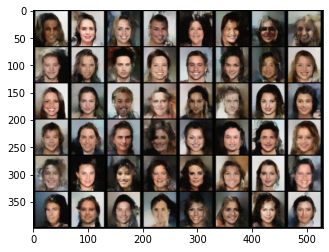

In [34]:
h = sample(gaussian, n_samples=48, n_levels=4, initial_channels=3, initial_hw=64, std=.7)
with torch.no_grad():
    xs, _ = glow_model.backward(h)
xs = xs.detach().cpu()#{.view(-1,3,64,64)
imshow(torchvision.utils.make_grid(xs))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


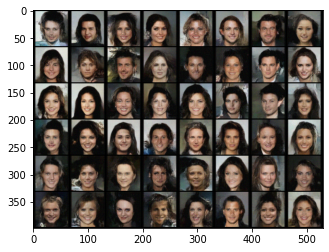

In [93]:
h = sample(gaussian, n_samples=48, n_levels=4, initial_channels=3, initial_hw=64, std=.6)
with torch.no_grad():
    xs, _ = glow_model.backward(h)
xs = xs.detach().cpu()#{.view(-1,3,64,64)
imshow(torchvision.utils.make_grid(xs))

In [94]:
torch.save(glow_model.state_dict(), "glow_celeba_4l_24d_3e.pt")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


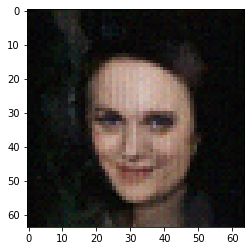

In [99]:
plt.imshow(xs[42].permute(1,2,0))
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


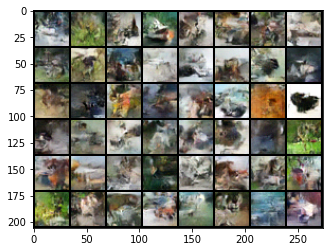

In [45]:
h = sample(gaussian, n_samples=48, n_levels=3, initial_channels=3, initial_hw=32, std=.99)
with torch.no_grad():
    xs, _ = glow_model.backward(h)
xs = xs.detach().cpu().view(-1,3,32,32)
imshow(torchvision.utils.make_grid(xs))

In [56]:
#Loading a pretrained glow model
glow_model2 = GLOW(channels = 3, depth=32, n_levels=3).to(device)

with torch.no_grad():
    zs, logdet = glow_model2(images.to(device))
    x, _ = glow_model2.backward(zs)

glow_model2.load_state_dict(torch.load("glow_cifar_3l_32d.pt"), strict=True)